In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error
from math import sqrt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
usa = pd.read_csv('new_Data/United States.csv')
usa

,STATION,NAME,DATE,TAVG
0,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",1974-01-01,28.45
1,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",1974-02-01,31.48
2,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",1974-03-01,40.09
3,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",1974-04-01,49.46
4,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",1974-05-01,58.93
...,...,...,...,...
9627,USC00290041,"ABIQUIU DAM, NM US",2023-10-01,56.50
9628,USC00290041,"ABIQUIU DAM, NM US",2023-11-01,40.40
9629,USC00290041,"ABIQUIU DAM, NM US",2023-12-01,31.96
9630,USC00290041,"ABIQUIU DAM, NM US",2024-01-01,28.45


In [3]:
usa['DATE'] = pd.to_datetime(usa['DATE'])
usa.reset_index(drop=True, inplace=True)
usa.set_index('DATE', inplace=True)
usa

,STATION,NAME,TAVG
DATE,,,
1974-01-01,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",28.45
1974-02-01,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",31.48
1974-03-01,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",40.09
1974-04-01,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",49.46
1974-05-01,USW00094989,"AMES MUNICIPAL AIRPORT, IA US",58.93
...,...,...,...
2023-10-01,USC00290041,"ABIQUIU DAM, NM US",56.50
2023-11-01,USC00290041,"ABIQUIU DAM, NM US",40.40
2023-12-01,USC00290041,"ABIQUIU DAM, NM US",31.96


In [4]:
usa = usa[(usa['NAME'] != 'ABERDEEN PHILLIPS FIELD, MD US') & (usa['NAME'] != '1 N MCLEANSBORO, IL US')& (usa['NAME'] != 'ABERDEEN, MS US')& (usa['NAME'] != 'ARCATA EUREKA AIRPORT, CA US')& (usa['NAME'] != 'AMES MUNICIPAL AIRPORT, IA US')]


In [5]:
cities = usa['NAME'].unique()
cities

array(['ALPENA CO REGIONAL AIRPORT, MI US',
       'ABERDEEN EXPERIMENT STATION, ID US',
       'ALBANY INTERNATIONAL AIRPORT, NY US',
       'ASTORIA AIRPORT PORT OF, OR US', 'AKRON CANTON AIRPORT, OH US',
       'ABERDEEN REGIONAL AIRPORT, SD US', 'AUGUSTA STATE AIRPORT, ME US',
       'ABILENE, KS US', 'ABINGDON 3 S, VA US',
       'AKRON WASHINGTON CO AIRPORT, CO US', 'ABIQUIU DAM, NM US'],
      dtype=object)

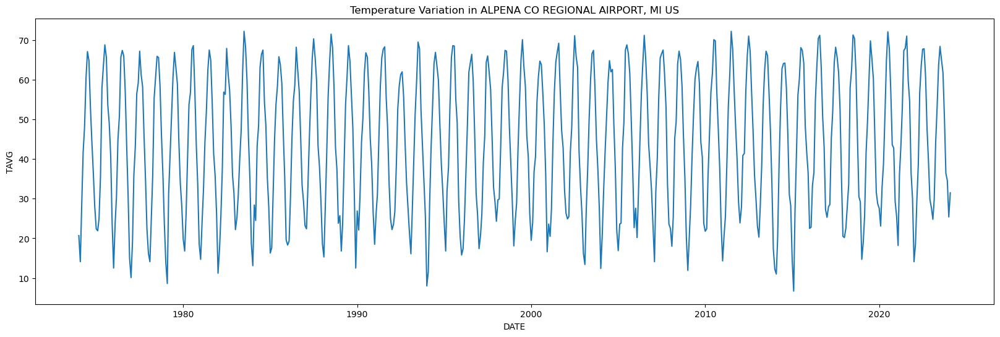

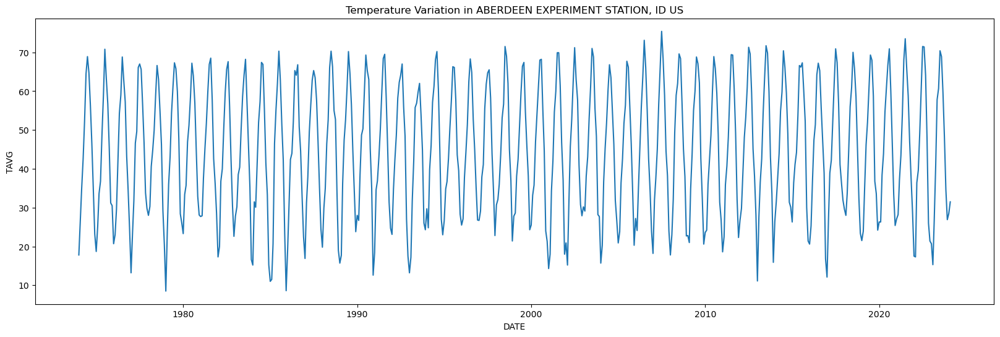

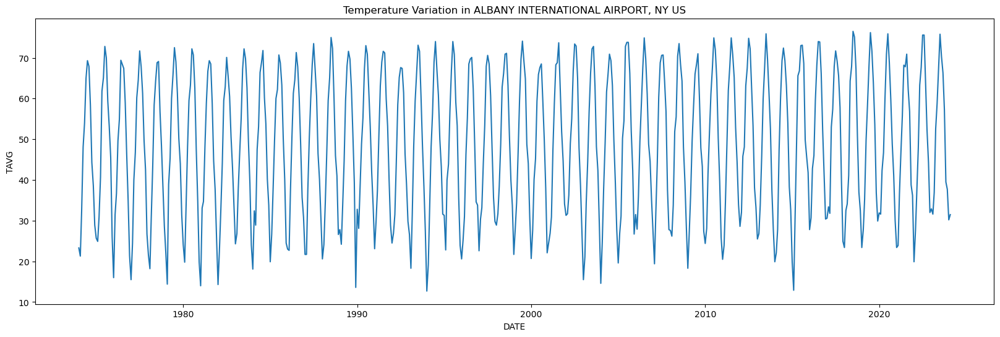

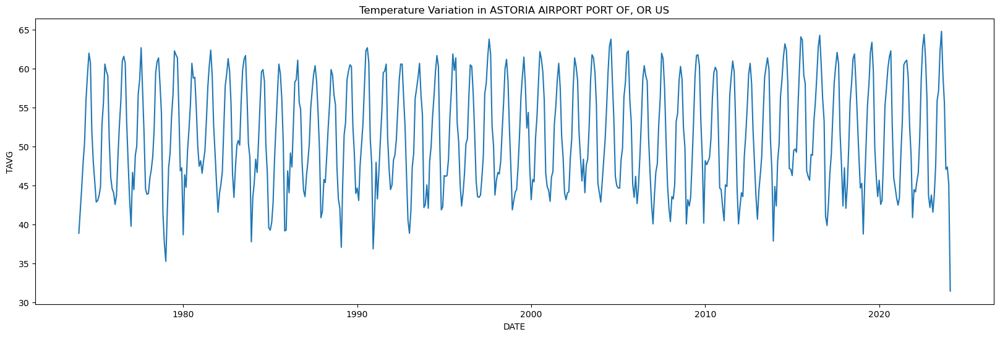

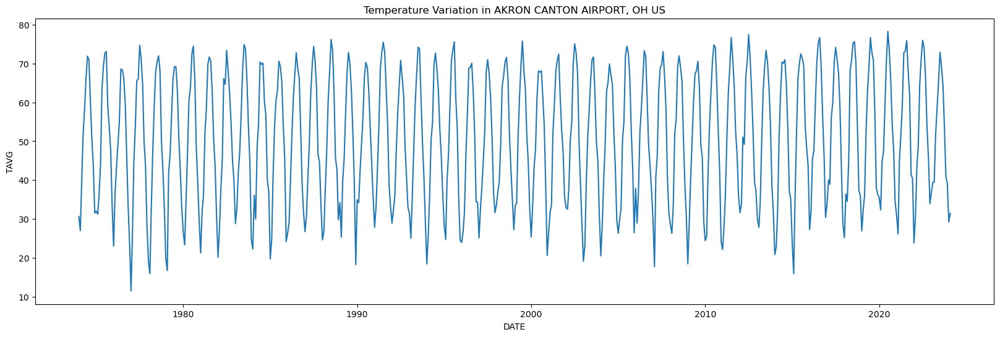

...

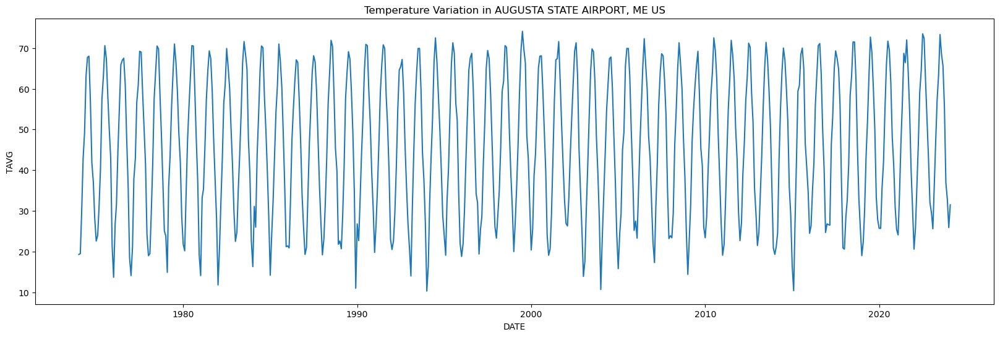

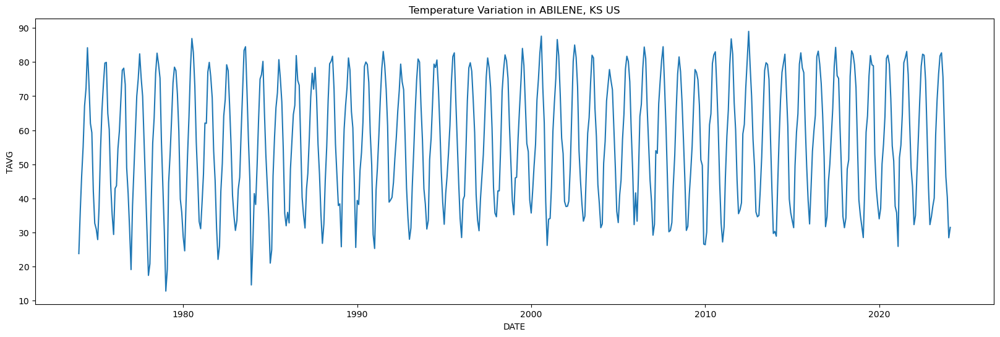

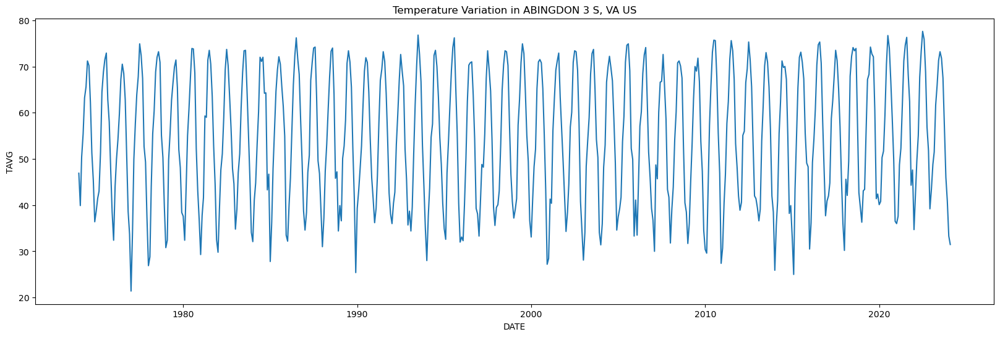

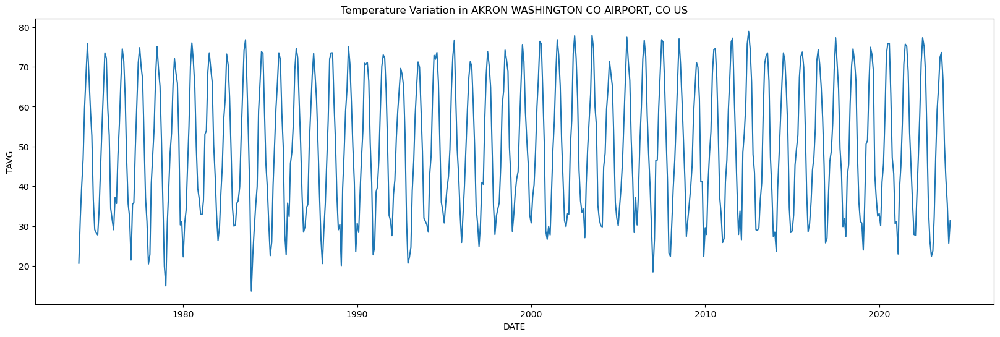

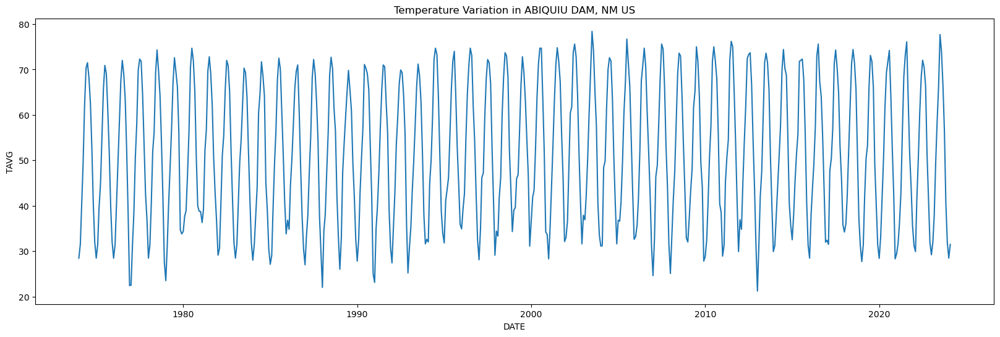

In [6]:
for city in cities:
    city_data = usa[usa['NAME'] == city]
    plt.figure(figsize=(20,6))
    sns.lineplot(x=city_data.index, y=city_data['TAVG'])
    plt.title('Temperature Variation in '+city)
    plt.show()

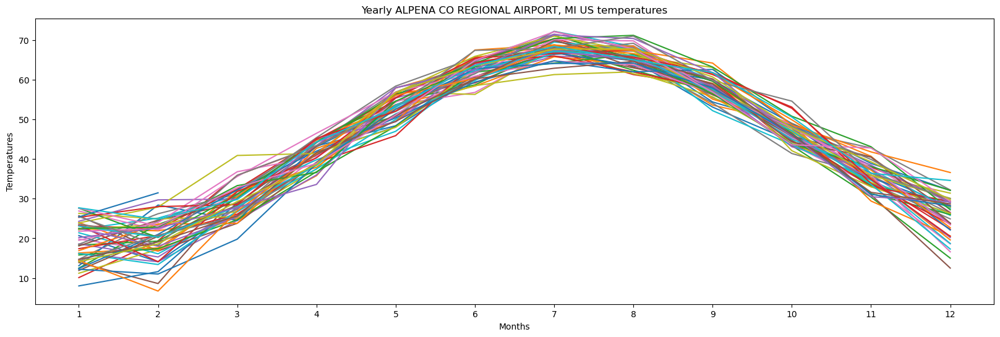

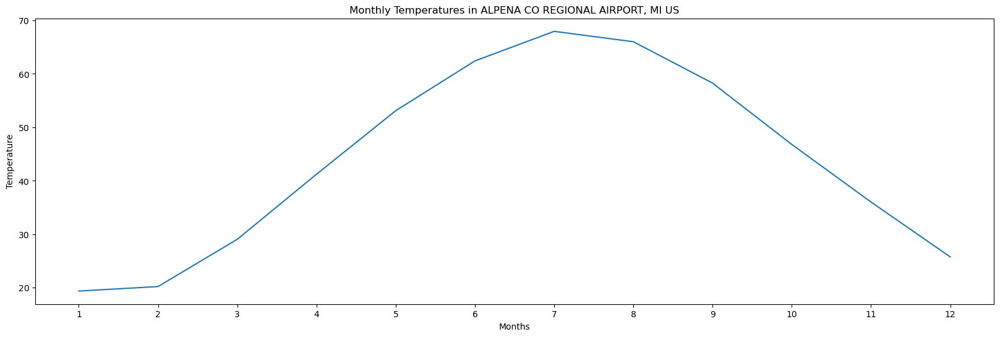

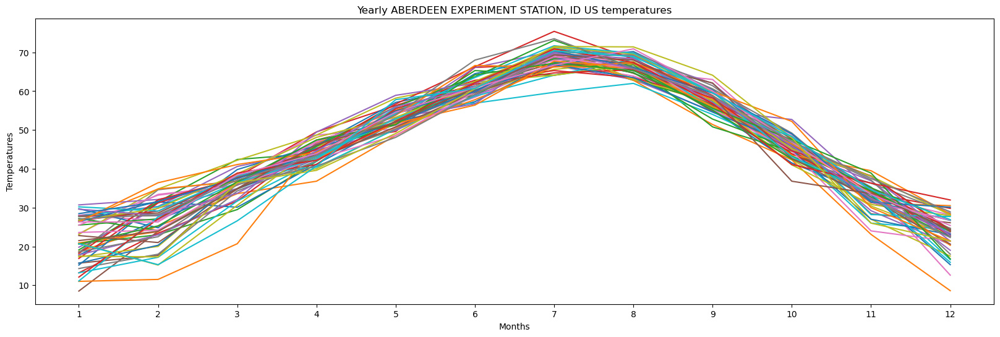

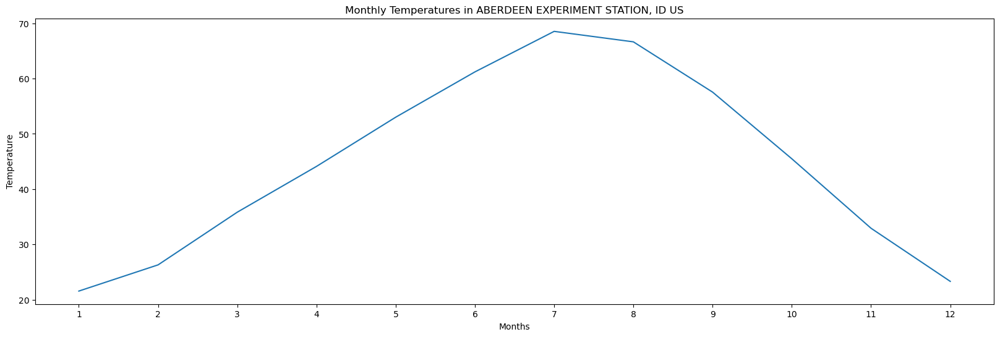

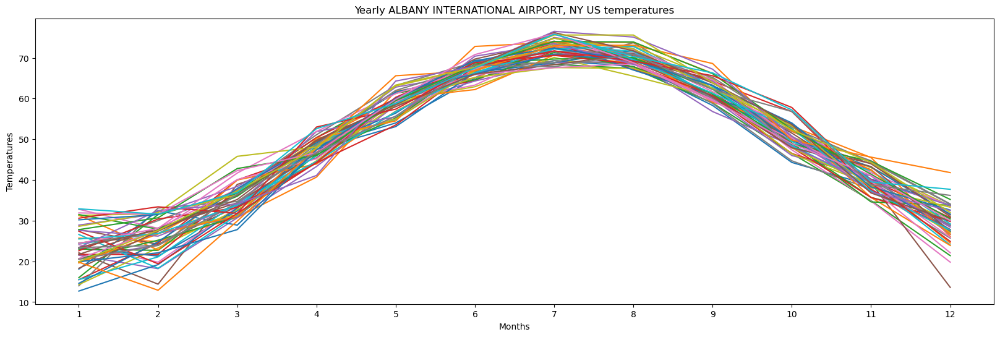

...

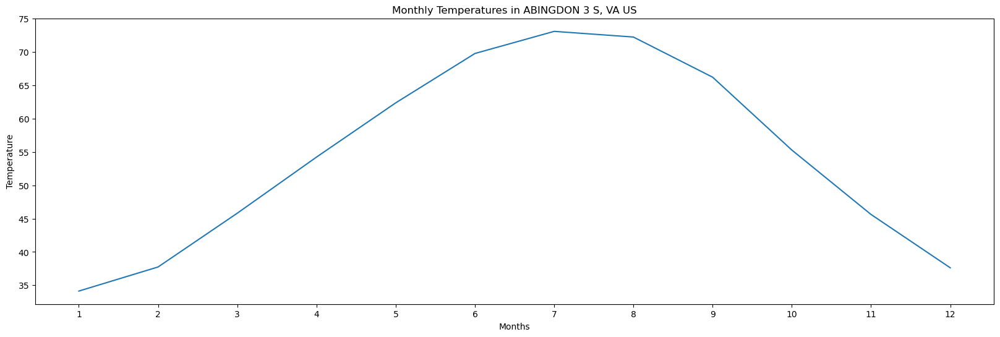

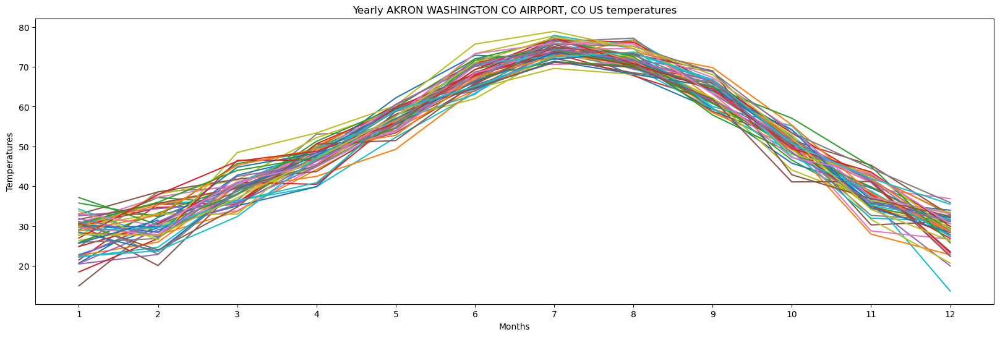

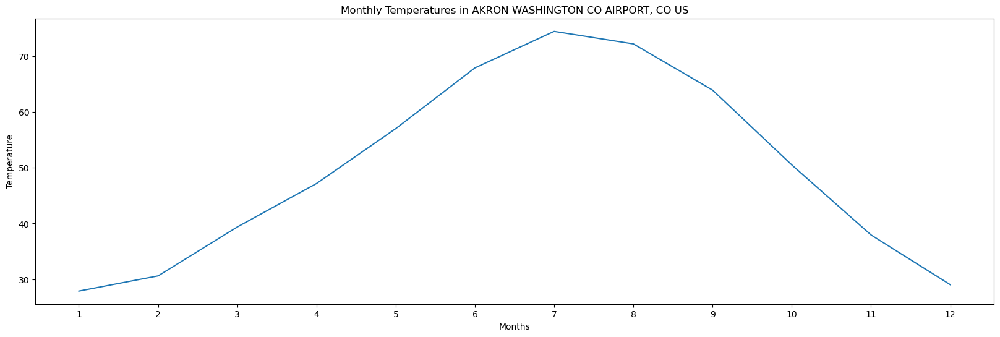

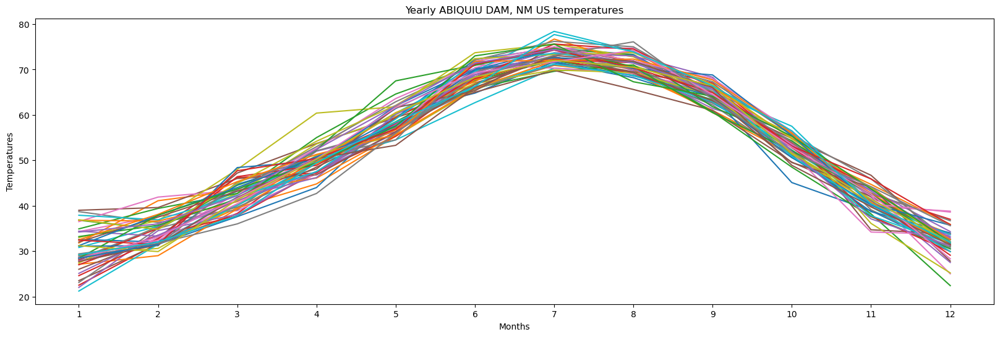

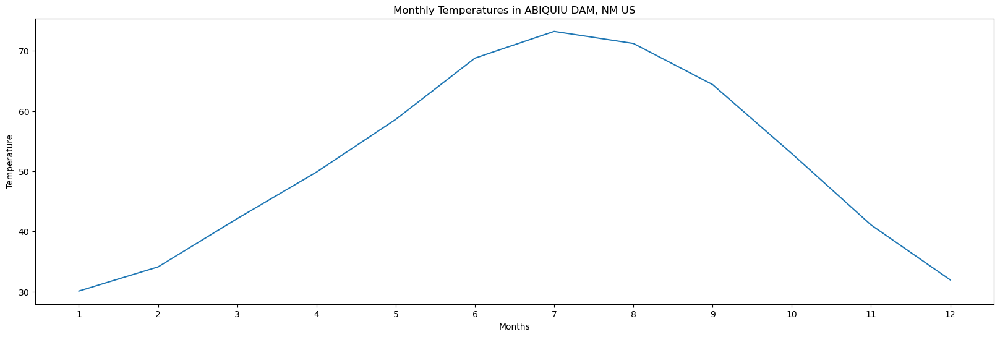

In [7]:
for city in cities:
    city_data = usa[usa['NAME'] == city]
    city_data['month'] = city_data.index.month
    city_data['year'] = city_data.index.year
    pivot = pd.pivot_table(city_data, values='TAVG', index='month', columns='year', aggfunc='mean')
    pivot.plot(figsize=(20,6))
    plt.title('Yearly '+city+' temperatures')
    plt.xlabel('Months')
    plt.ylabel('Temperatures')
    plt.xticks([x for x in range(1,13)])
    plt.legend().remove()
    plt.show()
    
    monthly_seasonality = pivot.mean(axis=1)
    monthly_seasonality.plot(figsize=(20,6))
    plt.title('Monthly Temperatures in '+city)
    plt.xlabel('Months')
    plt.ylabel('Temperature')
    plt.xticks([x for x in range(1,13)])
    plt.show()



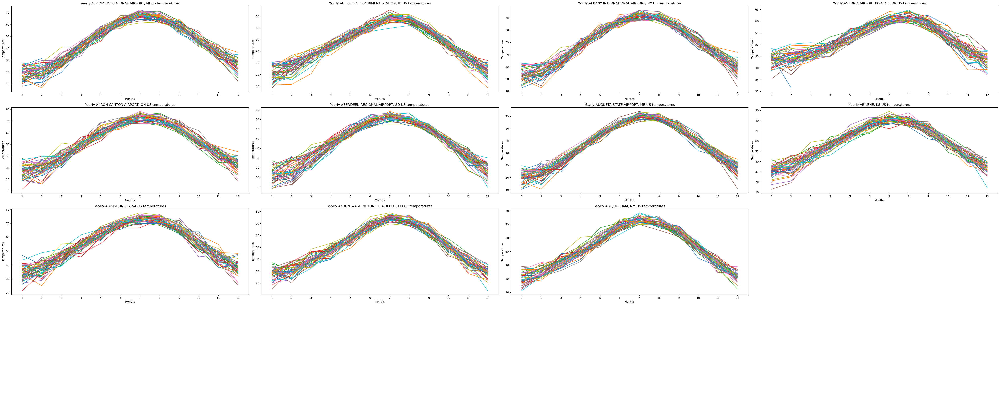

In [8]:
# All graphs in a single 4x4 plot.    
    
fig, axs = plt.subplots(4, 4, figsize=(100, 100))
axs = axs.flatten()

for i, city in enumerate(cities):
    # Get data for the current city
    city_data = usa[usa['NAME'] == city]
    city_data['month'] = city_data.index.month
    city_data['year'] = city_data.index.year
    pivot = pd.pivot_table(city_data, values='TAVG', index='month', columns='year', aggfunc='mean')
    pivot.plot(ax=axs[i], figsize=(50, 20))
    axs[i].set_title('Yearly '+city+' temperatures')
    axs[i].set_xlabel('Months')
    axs[i].set_ylabel('Temperatures')
    axs[i].set_xticks([x for x in range(1, 13)])
    axs[i].legend().remove()

for i in range(len(cities), len(axs)):
    axs[i].axis('off')

plt.tight_layout()
plt.show()

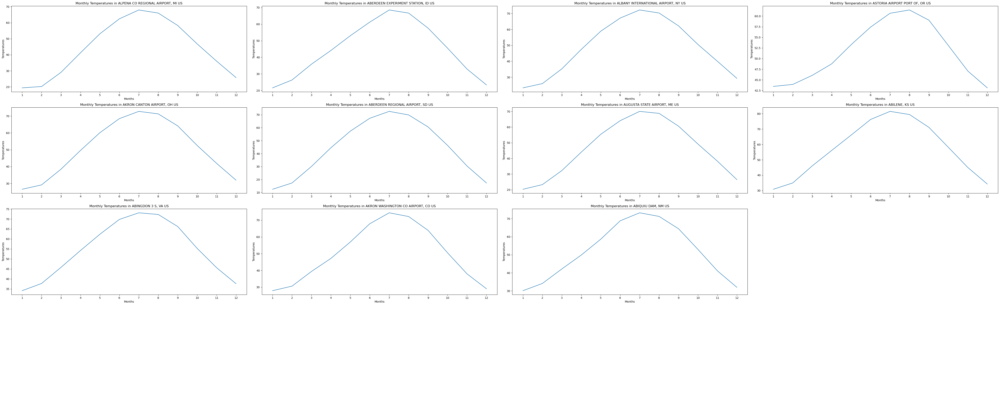

In [9]:
fig, axs = plt.subplots(4, 4, figsize=(100, 100))
axs = axs.flatten()

for i, city in enumerate(cities):
    city_data = usa[usa['NAME'] == city]
    city_data['month'] = city_data.index.month
    city_data['year'] = city_data.index.year
    pivot = pd.pivot_table(city_data, values='TAVG', index='month', columns='year', aggfunc='mean')
    monthly_seasonality = pivot.mean(axis=1)
    monthly_seasonality.plot(ax=axs[i], figsize=(50, 20))
    axs[i].set_title('Monthly Temperatures in '+city)
    axs[i].set_xlabel('Months')
    axs[i].set_ylabel('Temperatures')
    axs[i].set_xticks([x for x in range(1, 13)])

for i in range(len(cities), len(axs)):
    axs[i].axis('off')

plt.tight_layout()
plt.show()

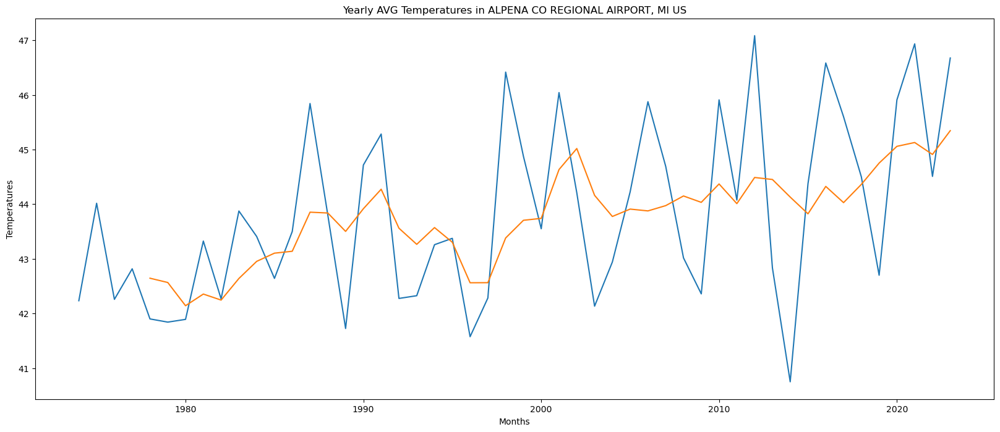

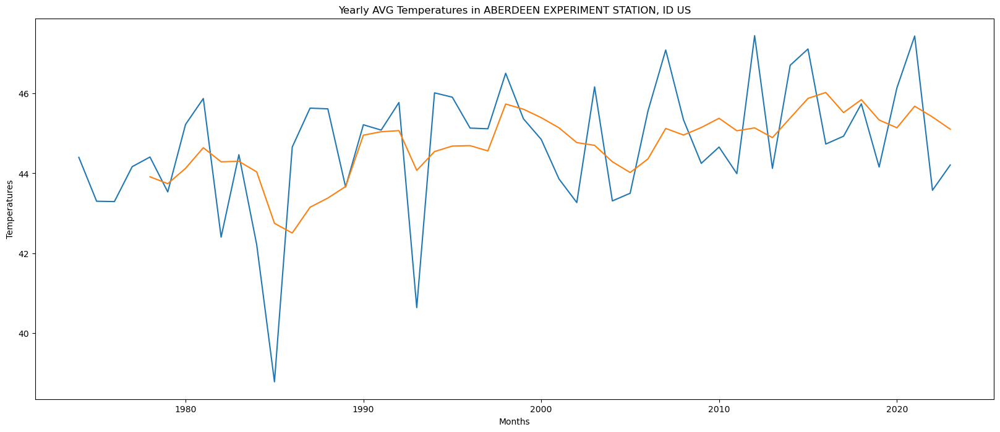

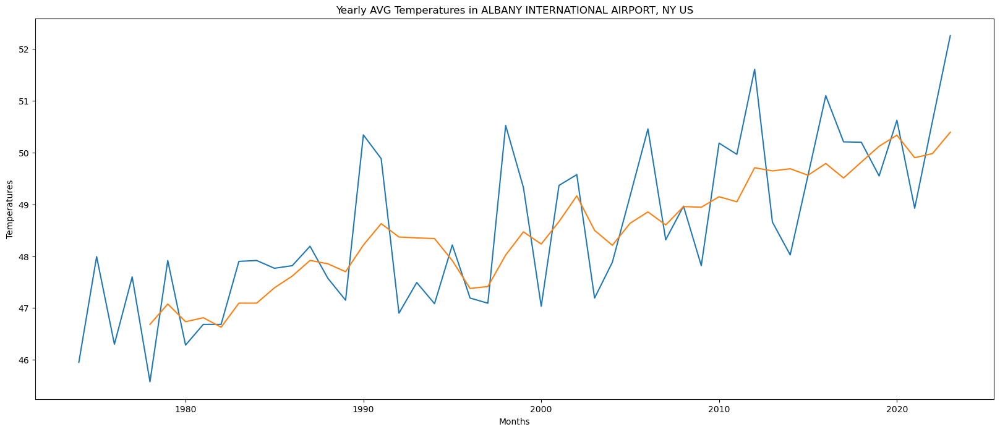

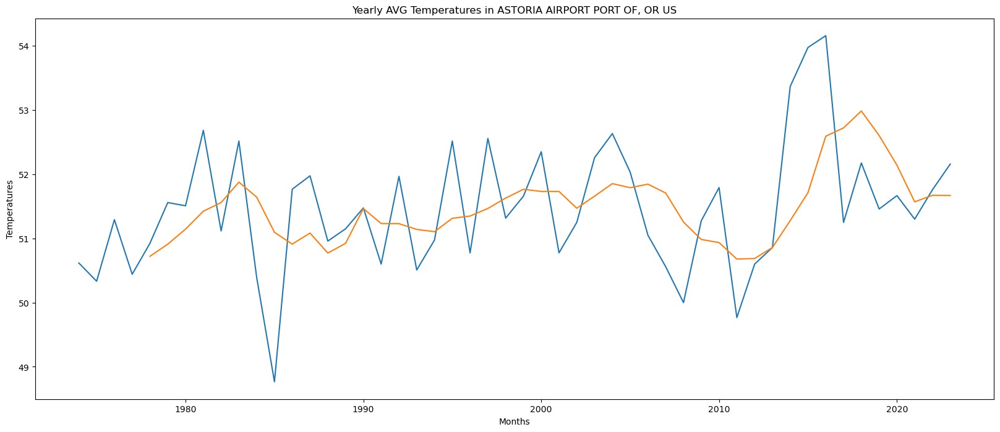

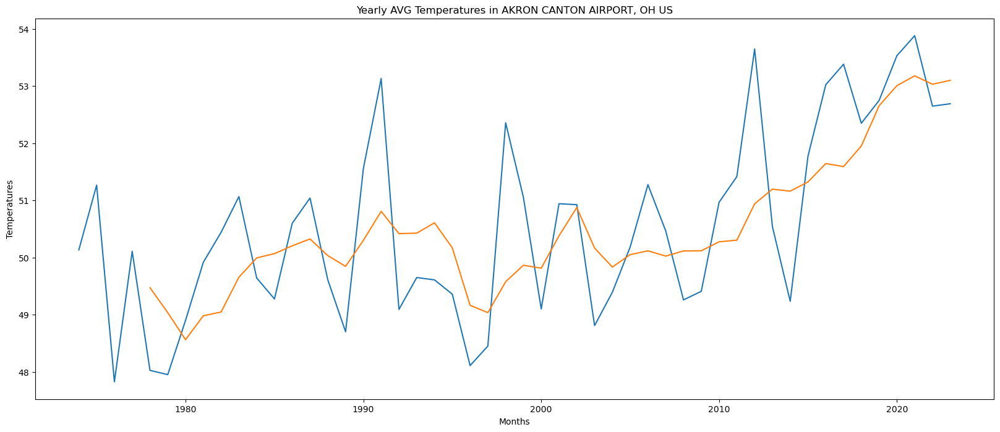

...

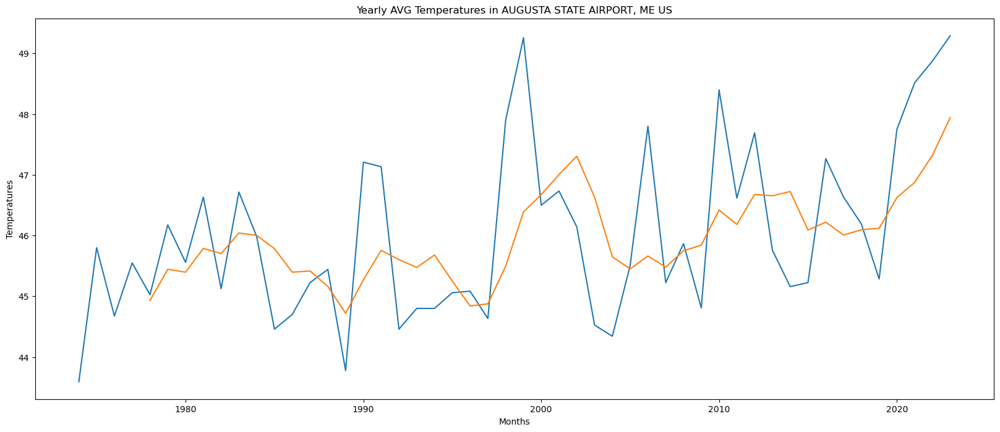

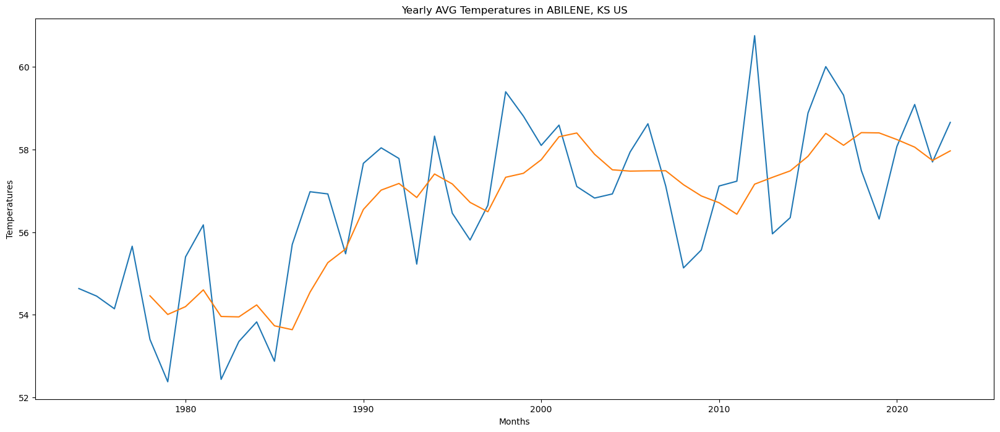

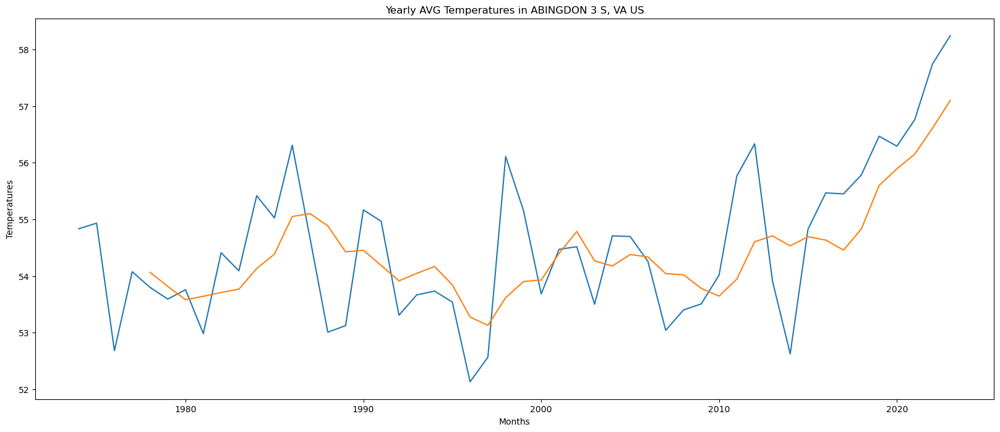

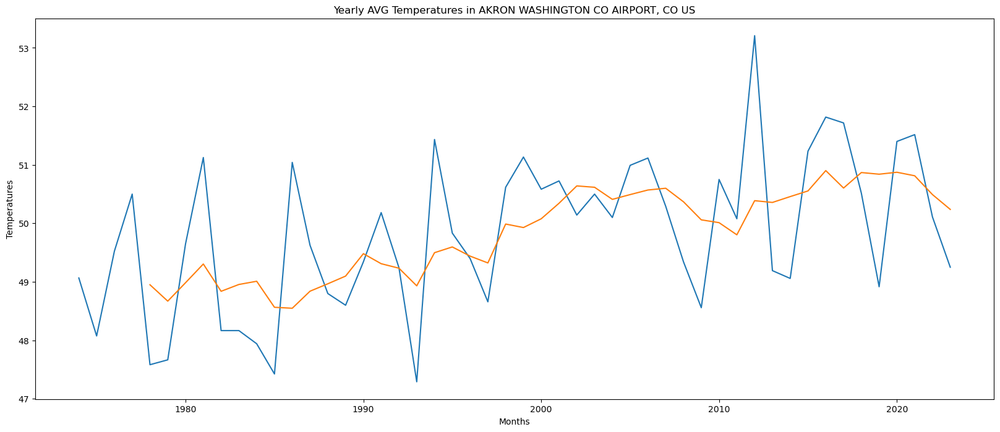

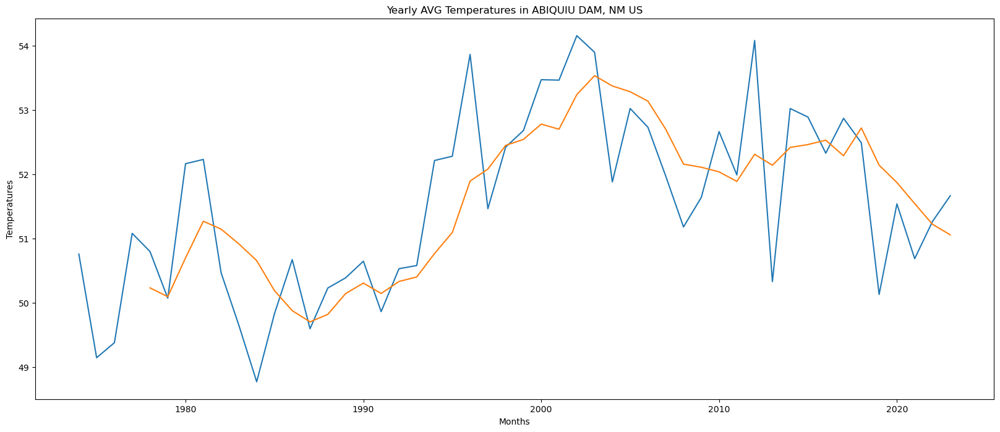

In [10]:
for i, city in enumerate(cities):
    city_data = usa[usa['NAME'] == city]
    city_data['month'] = city_data.index.month
    city_data['year'] = city_data.index.year
    city_data = city_data[city_data['year'] <= 2023]
    year_avg = pd.pivot_table(city_data, values='TAVG', index='year', aggfunc='mean')
    year_avg['5 Years MA'] = year_avg['TAVG'].rolling(5).mean()
    year_avg[['TAVG','5 Years MA']].plot(figsize=(20, 8))
    plt.title('Yearly AVG Temperatures in '+city)
    plt.xlabel('Months')
    plt.ylabel('Temperatures')
    plt.legend().remove()
    plt.show()

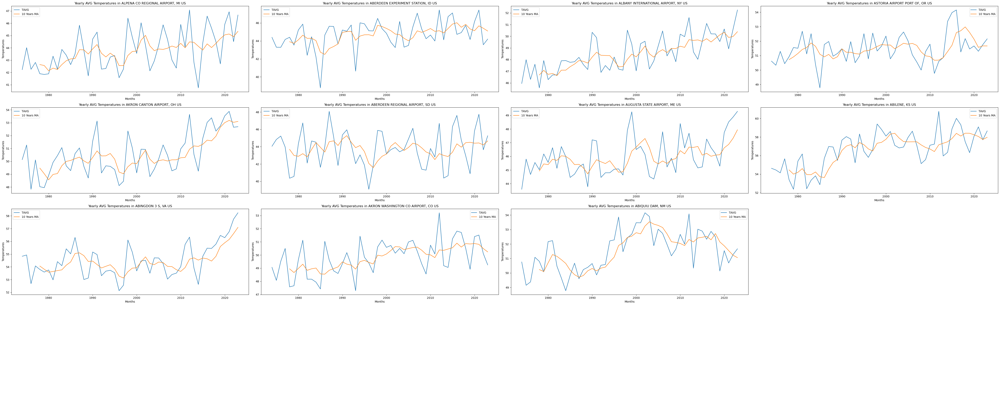

In [11]:
fig, axs = plt.subplots(4, 4, figsize=(100, 100))
axs = axs.flatten()

for i, city in enumerate(cities):
    city_data = usa[usa['NAME'] == city]
    city_data['month'] = city_data.index.month
    city_data['year'] = city_data.index.year
    city_data = city_data[city_data['year'] <= 2023]
    year_avg = pd.pivot_table(city_data, values='TAVG', index='year', aggfunc='mean')
    year_avg['10 Years MA'] = year_avg['TAVG'].rolling(5).mean()
    year_avg[['TAVG','10 Years MA']].plot(ax=axs[i], figsize=(50, 20))
    axs[i].set_title('Yearly AVG Temperatures in '+city)
    axs[i].set_xlabel('Months')
    axs[i].set_ylabel('Temperatures')

for i in range(len(cities), len(axs)):
    axs[i].axis('off')

plt.tight_layout()
plt.show()

In [12]:
data = usa[(usa['NAME'] == 'ALBANY INTERNATIONAL AIRPORT, NY US')]
data

,STATION,NAME,TAVG
DATE,,,
1974-01-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",23.30
1974-02-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",21.30
1974-03-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",32.40
1974-04-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",48.10
1974-05-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",54.00
...,...,...,...
2023-10-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",57.20
2023-11-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",39.50
2023-12-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",37.70


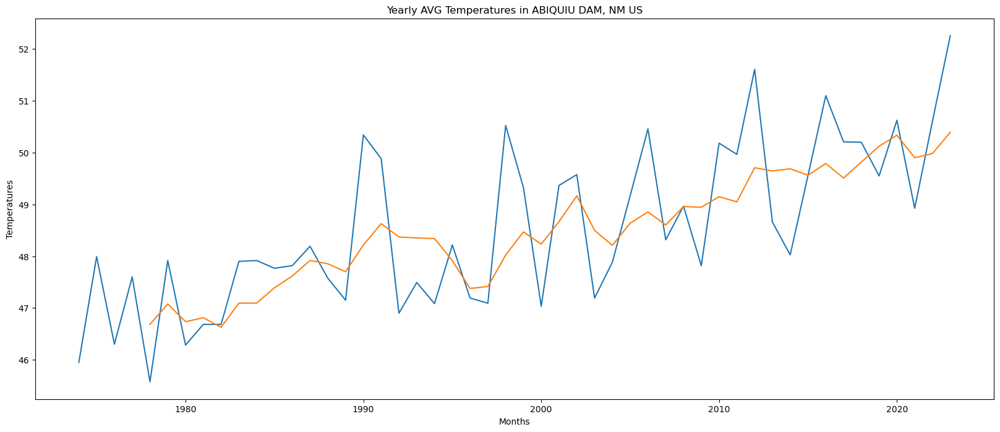

In [13]:
data['month'] = data.index.month
data['year'] = data.index.year
data = data[data['year'] <= 2023]
year_avg = pd.pivot_table(data, values='TAVG', index='year', aggfunc='mean')
year_avg['10 Years MA'] = year_avg['TAVG'].rolling(5).mean()
year_avg[['TAVG','10 Years MA']].plot(figsize=(20, 8))
plt.title('Yearly AVG Temperatures in '+city)
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.legend().remove()
plt.show()

In [14]:
train = data[:-60].copy()
val = data[-60:-12].copy()
test = data[-12:].copy()

In [15]:
val

,STATION,NAME,TAVG,month,year
DATE,,,,,
2019-01-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",23.4,1,2019
2019-02-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",27.7,2,2019
2019-03-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",35.2,3,2019
2019-04-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",49.8,4,2019
2019-05-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",58.5,5,2019
2019-06-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",68.0,6,2019
2019-07-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",76.2,7,2019
2019-08-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",71.7,8,2019
2019-09-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",63.8,9,2019


In [16]:
baseline = val['TAVG'].shift()
baseline.dropna(inplace=True)
baseline.head()

DATE
2019-02-01    23.4
2019-03-01    27.7
2019-04-01    35.2
2019-05-01    49.8
2019-06-01    58.5
Name: TAVG, dtype: float64

In [17]:
def measure_rmse(y_true, y_pred):
    return sqrt(mean_squared_error(y_true,y_pred))

# Using the function with the baseline values
rmse_base = measure_rmse(val.iloc[1:,2],baseline)
print(f'The RMSE of the baseline that we will try to diminish is {round(rmse_base,4)} celsius degrees')

The RMSE of the baseline that we will try to diminish is 9.5153 celsius degrees


In [18]:
def check_stationarity(y, lags_plots=48, figsize=(22,8)):
    "Use Series as parameter"
    
    # Creating plots of the DF
    y = pd.Series(y)
    fig = plt.figure()

    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=2)
    ax2 = plt.subplot2grid((3, 3), (1, 0))
    ax3 = plt.subplot2grid((3, 3), (1, 1))
    ax4 = plt.subplot2grid((3, 3), (2, 0), colspan=2)

    y.plot(ax=ax1, figsize=figsize)
    ax1.set_title('USA Temperature Variation')
    plot_acf(y, lags=lags_plots, zero=False, ax=ax2);
    plot_pacf(y, lags=lags_plots, zero=False, ax=ax3);
    sns.distplot(y, bins=int(sqrt(len(y))), ax=ax4)
    ax4.set_title('Distribution Chart')

    plt.tight_layout()
    
    print('Results of Dickey-Fuller Test:')
    adfinput = adfuller(y)
    adftest = pd.Series(adfinput[0:4], index=['Test Statistic','p-value','Lags Used','Number of Observations Used'])
    adftest = round(adftest,4)
    
    for key, value in adfinput[4].items():
        adftest["Critical Value (%s)"%key] = value.round(4)
        
    print(adftest)
    
    if adftest[0].round(2) < adftest[5].round(2):
        print('\nThe Test Statistics is lower than the Critical Value of 5%.\nThe serie seems to be stationary')
    else:
        print("\nThe Test Statistics is higher than the Critical Value of 5%.\nThe serie isn't stationary")

Results of Dickey-Fuller Test:
Test Statistic                  -5.3554
p-value                          0.0000
Lags Used                       17.0000
Number of Observations Used    522.0000
Critical Value (1%)             -3.4429
Critical Value (5%)             -2.8671
Critical Value (10%)            -2.5697
dtype: float64

The Test Statistics is lower than the Critical Value of 5%.
The serie seems to be stationary


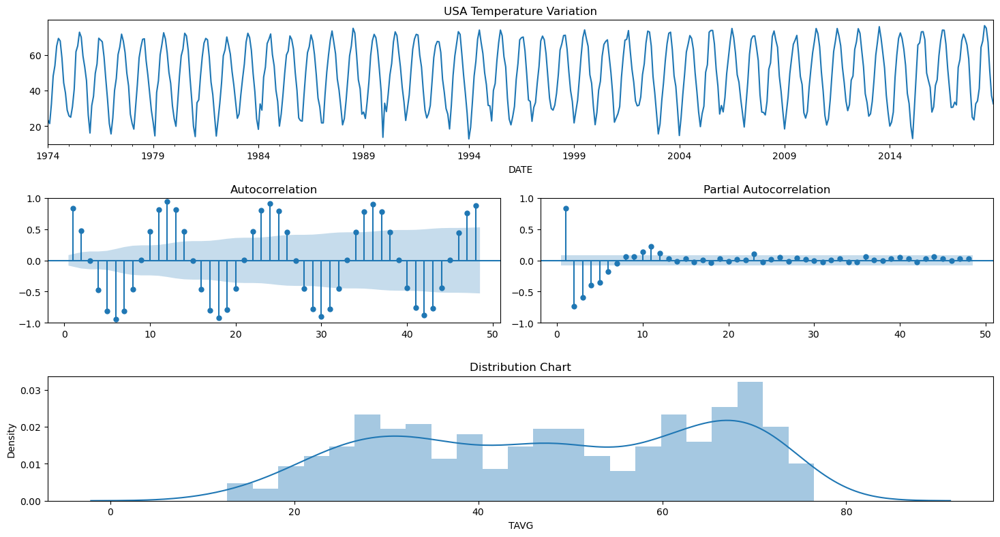

In [19]:
# The first approach is to check the series without any transformation
check_stationarity(train['TAVG'])


Results of Dickey-Fuller Test:
Test Statistic                  -9.7000
p-value                          0.0000
Lags Used                       12.0000
Number of Observations Used    515.0000
Critical Value (1%)             -3.4431
Critical Value (5%)             -2.8672
Critical Value (10%)            -2.5698
dtype: float64

The Test Statistics is lower than the Critical Value of 5%.
The serie seems to be stationary


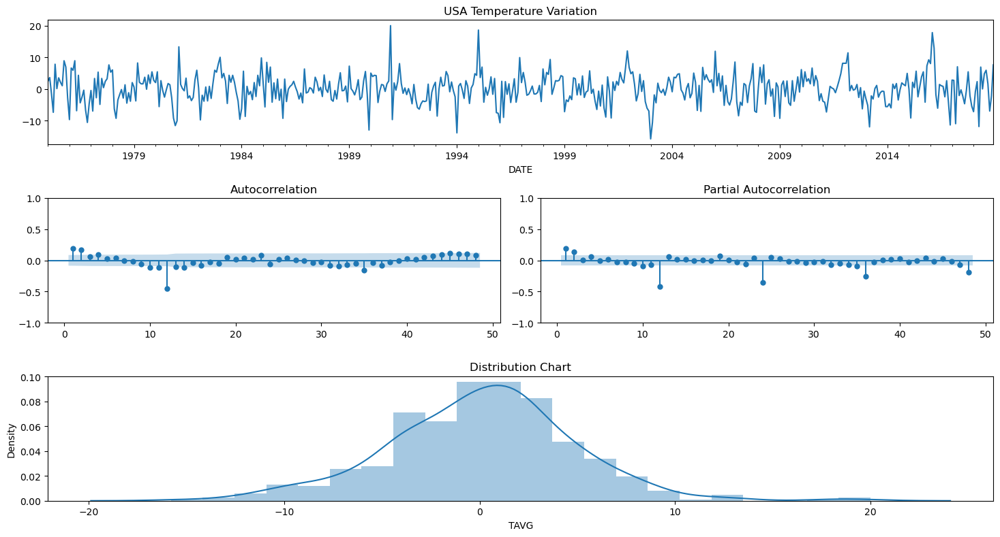

In [20]:
check_stationarity(train['TAVG'].diff(12).dropna())

In [21]:
def walk_forward(training_set, validation_set, params):
    '''
    Params: it's a tuple where you put together the following SARIMA parameters: ((pdq), (PDQS), trend)
    '''
    history = [x for x in training_set.values]
    prediction = list()
    
    # Using the SARIMA parameters and fitting the data
    pdq, PDQS, trend = params

    #Forecasting one period ahead in the validation set
    for week in range(len(validation_set)):
        model = sm.tsa.statespace.SARIMAX(history, order=pdq, seasonal_order=PDQS, trend=trend)
        result = model.fit(disp=False)
        yhat = result.predict(start=len(history), end=len(history))
        prediction.append(yhat[0])
        history.append(validation_set[week])
        
    return prediction

In [22]:
val['Pred'] = walk_forward(train['TAVG'], val['TAVG'], ((3,0,0),(0,1,1,12),'c'))

In [23]:
# Measuring the error of the prediction
rmse_pred = measure_rmse(val['TAVG'], val['Pred'])

print(f"The RMSE of the SARIMA(3,0,0),(0,1,1,12),'c' model was {round(rmse_pred,4)} celsius degrees")
print(f"It's a decrease of {round((rmse_pred/rmse_base-1)*100,2)}% in the RMSE")

The RMSE of the SARIMA(3,0,0),(0,1,1,12),'c' model was 2.8908 celsius degrees
It's a decrease of -69.62% in the RMSE


In [24]:
# Creating the error column
val['Error'] = val['TAVG'] - val['Pred']


In [25]:
def plot_error(data, figsize=(20,8)):
    '''
    There must have 3 columns following this order: Temperature, Prediction, Error
    '''
    plt.figure(figsize=figsize)
    ax1 = plt.subplot2grid((2,2), (0,0))
    ax2 = plt.subplot2grid((2,2), (0,1))
    ax3 = plt.subplot2grid((2,2), (1,0))
    ax4 = plt.subplot2grid((2,2), (1,1))

    #Plotting the Current and Predicted values
    ax1.plot(data.iloc[:,2:4])
    ax1.legend(['Real','Pred'])
    ax1.set_title('Current and Predicted Values')
    
    # Residual vs Predicted values
    ax2.scatter(data.iloc[:,3], data.iloc[:,4])
    ax2.set_xlabel('Predicted Values')
    ax2.set_ylabel('Errors')
    ax2.set_title('Errors versus Predicted Values')
    
    ## QQ Plot of the residual
    sm.graphics.qqplot(data.iloc[:,4], line='r', ax=ax3)
 
    # Autocorrelation plot of the residual
    plot_acf(data.iloc[:,4], lags=(len(data.iloc[:,4])-1),zero=False, ax=ax4)
    plt.tight_layout()
    plt.show()

In [26]:
# We need to remove some columns to plot the charts
val.drop(['month','year'], axis=1, inplace=True)
val.head()

,STATION,NAME,TAVG,Pred,Error
DATE,,,,,
2019-01-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",23.4,24.460521,-1.060521
2019-02-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",27.7,27.340894,0.359106
2019-03-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",35.2,36.691826,-1.491826
2019-04-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",49.8,48.890777,0.909223
2019-05-01,USW00014735,"ALBANY INTERNATIONAL AIRPORT, NY US",58.5,60.524695,-2.024695


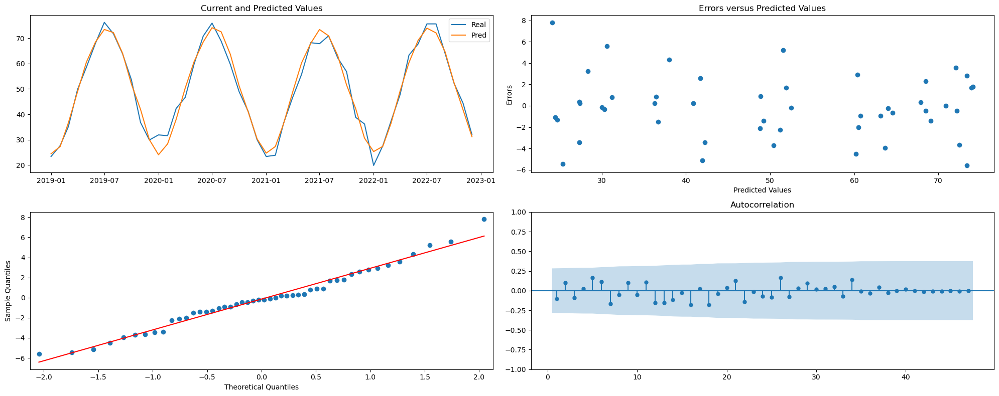

In [27]:
plot_error(val)

In [28]:
#Creating the new concatenating the training and validation set:
future = pd.concat([train['TAVG'], val['TAVG']])
future.head()

DATE
1974-01-01    23.3
1974-02-01    21.3
1974-03-01    32.4
1974-04-01    48.1
1974-05-01    54.0
Name: TAVG, dtype: float64

In [29]:
# Using the same parameters of the fitted model
model = sm.tsa.statespace.SARIMAX(future, order=(3,0,0), seasonal_order=(0,1,1,12), trend='c')
result = model.fit(disp=False)

In [30]:
test['Pred'] = result.predict(start=(len(future)), end=(len(future)+13))

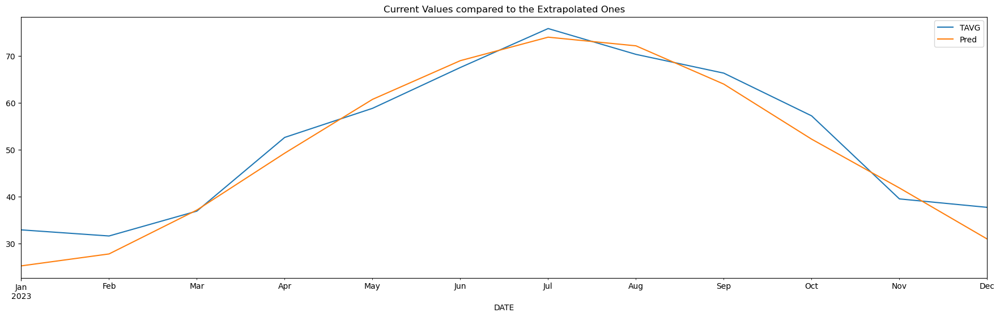

In [31]:
test[['TAVG', 'Pred']].plot(figsize=(22,6))
plt.title('Current Values compared to the Extrapolated Ones')
plt.show()

In [32]:
test_baseline = test['TAVG'].shift()

test_baseline[0] = test['TAVG'][0]

rmse_test_base = measure_rmse(test['TAVG'],test_baseline)
rmse_test_extrap = measure_rmse(test['TAVG'], test['Pred'])

print(f'The baseline RMSE for the test baseline was {round(rmse_test_base,2)} celsius degrees')
print(f'The baseline RMSE for the test extrapolation was {round(rmse_test_extrap,2)} celsius degrees')
print(f'That is an improvement of {-round((rmse_test_extrap/rmse_test_base-1)*100,2)}%')

The baseline RMSE for the test baseline was 8.68 celsius degrees
The baseline RMSE for the test extrapolation was 3.86 celsius degrees
That is an improvement of 55.59%


In [33]:
def check_stationarity(y, lags_plots=48, figsize=(28,10)):
    "Use Series as parameter"
    
    # Creating plots of the DF
    y = pd.Series(y)
    fig = plt.figure()

    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=2)
    ax2 = plt.subplot2grid((3, 3), (1, 0))
    ax3 = plt.subplot2grid((3, 3), (1, 1))
    ax4 = plt.subplot2grid((3, 3), (2, 0), colspan=2)

    y.plot(ax=ax1, figsize=figsize)
    ax1.set_title('USA Temperature Variation')
    plot_acf(y, lags=lags_plots, zero=False, ax=ax2);
    plot_pacf(y, lags=lags_plots, zero=False, ax=ax3);
    sns.distplot(y, bins=int(sqrt(len(y))), ax=ax4)
    ax4.set_title('Distribution Chart')

    plt.show()
    
    print('\nResults of Dickey-Fuller Test:')
    adfinput = adfuller(y)
    adftest = pd.Series(adfinput[0:4], index=['Test Statistic','p-value','Lags Used','Number of Observations Used'])
    adftest = round(adftest,4)
    
    for key, value in adfinput[4].items():
        adftest["Critical Value (%s)"%key] = value.round(4)
        
    print(adftest)
    
    if adftest[0].round(2) < adftest[5].round(2):
        print('\nThe Test Statistics is lower than the Critical Value of 5%.\nThe serie seems to be stationary')
    else:
        print("\nThe Test Statistics is higher than the Critical Value of 5%.\nThe serie isn't stationary")
        

In [34]:
def walk_forward(training_set, validation_set, params):
    '''
    Params: it's a tuple where you put together the following SARIMA parameters: ((pdq), (PDQS), trend)
    '''
    history = [x for x in training_set.values]
    prediction = list()
    
    # Using the SARIMA parameters and fitting the data
    pdq, PDQS, trend = params

    #Forecasting one period ahead in the validation set
    for week in range(len(validation_set)):
        model = sm.tsa.statespace.SARIMAX(history, order=pdq, seasonal_order=PDQS, trend=trend)
        result = model.fit(disp=False)
        yhat = result.predict(start=len(history), end=len(history))
        prediction.append(yhat[0])
        history.append(validation_set[week])
        
    return prediction

	 ALPENA CO REGIONAL AIRPORT, MI US  data :
                 STATION                               NAME   TAVG
DATE                                                             
1974-01-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  20.70
1974-02-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  14.10
1974-03-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  27.80
1974-04-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  41.60
1974-05-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  48.10
...                 ...                                ...    ...
2023-10-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  50.60
2023-11-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  36.40
2023-12-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  34.60
2024-01-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  25.40
2024-02-01  USW00094849  ALPENA CO REGIONAL AIRPORT, MI US  31.48

[602 rows x 3 columns] 




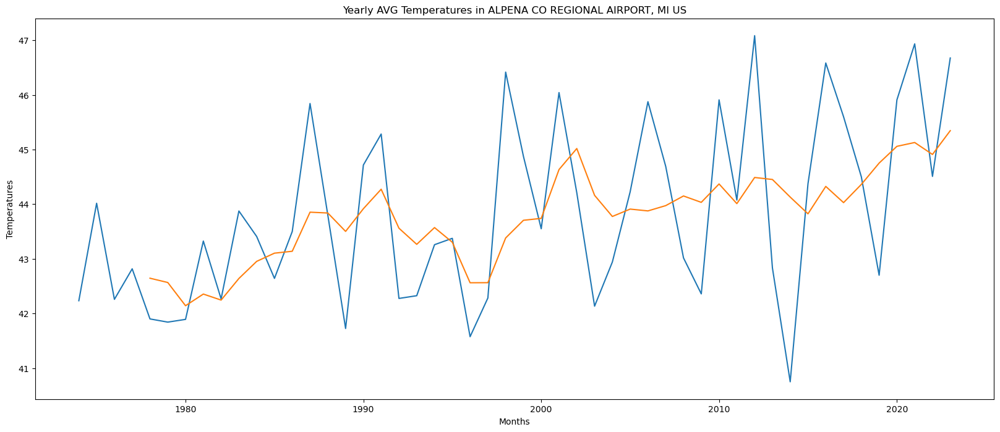

Baseline data in validation DATE
2019-02-01    14.7
2019-03-01    19.1
2019-04-01    25.7
2019-05-01    41.6
2019-06-01    49.5
Name: TAVG, dtype: float64 


The RMSE of the baseline that we will try to diminish is 9.8994 celsius degrees 




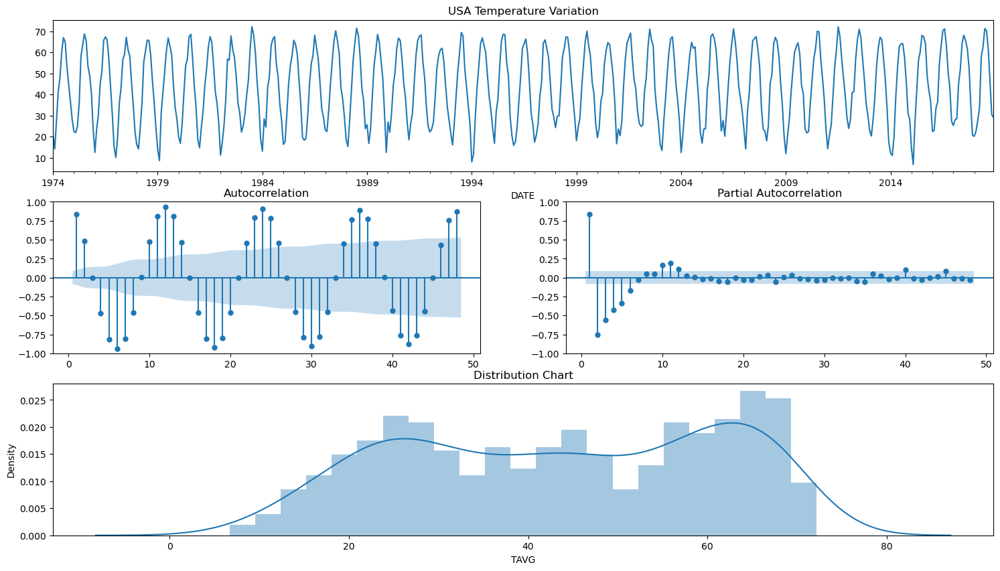


Results of Dickey-Fuller Test:
Test Statistic                  -5.9036
p-value                          0.0000
Lags Used                       17.0000
Number of Observations Used    522.0000
Critical Value (1%)             -3.4429
Critical Value (5%)             -2.8671
Critical Value (10%)            -2.5697
dtype: float64

The Test Statistics is lower than the Critical Value of 5%.
The serie seems to be stationary


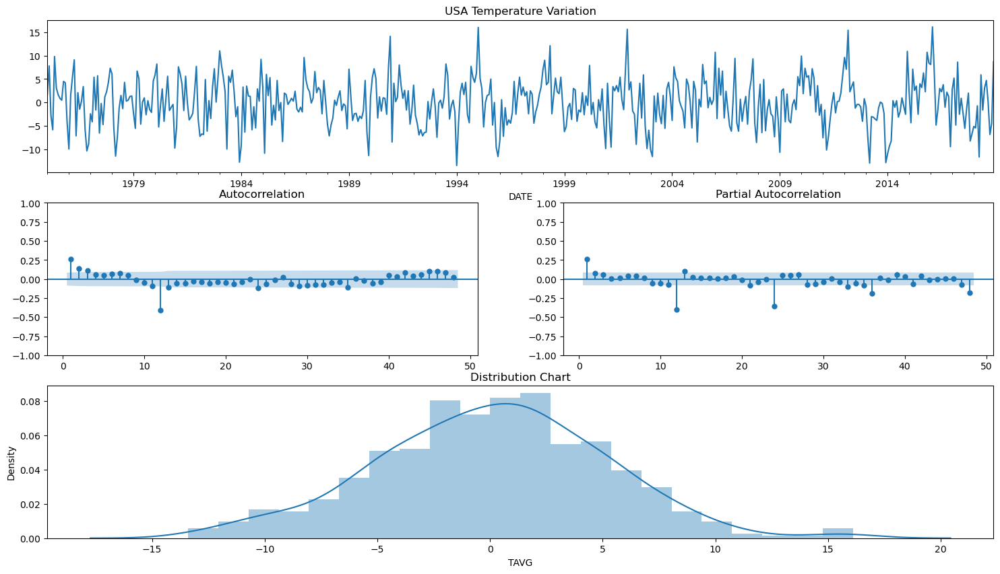


Results of Dickey-Fuller Test:
Test Statistic                  -8.3116
p-value                          0.0000
Lags Used                       12.0000
Number of Observations Used    515.0000
Critical Value (1%)             -3.4431
Critical Value (5%)             -2.8672
Critical Value (10%)            -2.5698
dtype: float64

The Test Statistics is lower than the Critical Value of 5%.
The serie seems to be stationary
Enter the values of p, d, q, P, D, Q, S:
Enter a number: 3
Enter a number: 0
Enter a number: 0
Enter a number: 0
Enter a number: 1
Enter a number: 1
Enter a number: 12
Enter a character for trend: c


KeyboardInterrupt: 

In [35]:
for city in cities:
    data = usa[usa['NAME'] == city]
    print("\t",city," data :\n",data,"\n\n")
    data['month'] = data.index.month
    data['year'] = data.index.year
    data = data[data['year'] <= 2023]
    year_avg = pd.pivot_table(data, values='TAVG', index='year', aggfunc='mean')
    year_avg['10 Years MA'] = year_avg['TAVG'].rolling(5).mean()
    year_avg[['TAVG','10 Years MA']].plot(figsize=(20, 8))
    plt.title('Yearly AVG Temperatures in '+city)
    plt.xlabel('Months')
    plt.ylabel('Temperatures')
    plt.legend().remove()
    plt.show()

    train = data[:-60].copy()
    val = data[-60:-12].copy()
    test = data[-12:].copy()

    baseline = val['TAVG'].shift()
    baseline.dropna(inplace=True)
    print("Baseline data in validation",baseline.head(),"\n\n")

    def measure_rmse(y_true, y_pred):
        return sqrt(mean_squared_error(y_true,y_pred))
    rmse_base = measure_rmse(val.iloc[1:,2],baseline)
    print(f'The RMSE of the baseline that we will try to diminish is {round(rmse_base,4)} celsius degrees',"\n\n")


    # The first approach is to check the series without any transformation
    check_stationarity(train['TAVG'])


    check_stationarity(train['TAVG'].diff(12).dropna())

    print("Enter the values of p, d, q, P, D, Q, S:")
    params = []
    for _ in range(7):
        param = int(input("Enter a number: "))
        params.append(param)

    # Prompt the user to enter 1 character
    trend = input("Enter a character for trend: ")

    # Extract parameters
    pdq = params[:3]
    PDQS = params[3:]

    val['Pred'] = walk_forward(train['TAVG'], val['TAVG'], (pdq,PDQS,trend))

    # Measuring the error of the prediction
    rmse_pred = measure_rmse(val['TAVG'], val['Pred'])

    print(f"The RMSE of the SARIMA(3,0,0),(0,1,1,12),'c' model was {round(rmse_pred,4)} celsius degrees")
    print(f"It's a decrease of {round((rmse_pred/rmse_base-1)*100,2)}% in the RMSE")

    # Creating the error column
    val['Error'] = val['TAVG'] - val['Pred']

    def plot_error(data, figsize=(20,8)):
        '''
        There must have 3 columns following this order: Temperature, Prediction, Error
        '''
        plt.figure(figsize=figsize)
        ax1 = plt.subplot2grid((2,2), (0,0))
        ax2 = plt.subplot2grid((2,2), (0,1))
        ax3 = plt.subplot2grid((2,2), (1,0))
        ax4 = plt.subplot2grid((2,2), (1,1))

        #Plotting the Current and Predicted values
        ax1.plot(data.iloc[:,2:4])
        ax1.legend(['Real','Pred'])
        ax1.set_title('Current and Predicted Values')

        # Residual vs Predicted values
        ax2.scatter(data.iloc[:,3], data.iloc[:,4])
        ax2.set_xlabel('Predicted Values')
        ax2.set_ylabel('Errors')
        ax2.set_title('Errors versus Predicted Values')

        ## QQ Plot of the residual
        sm.graphics.qqplot(data.iloc[:,4], line='r', ax=ax3)

        # Autocorrelation plot of the residual
        plot_acf(data.iloc[:,4], lags=(len(data.iloc[:,4])-1),zero=False, ax=ax4)
        plt.tight_layout()
        plt.show()

    # We need to remove some columns to plot the charts
    val.drop(['month','year'], axis=1, inplace=True)
    print(val.head(),"\n\n")
    plot_error(val)

    #Creating the new concatenating the training and validation set:
    future = pd.concat([train['TAVG'], val['TAVG']])
    print(future.head(),"\n\n")

    # Using the same parameters of the fitted model
    model = sm.tsa.statespace.SARIMAX(future, order=(3,0,0), seasonal_order=(0,1,1,12), trend='c')
    result = model.fit(disp=False)

    test['Pred'] = result.predict(start=(len(future)), end=(len(future)+13))
    test[['TAVG', 'Pred']].plot(figsize=(22,6))
    plt.title('Current Values compared to the Extrapolated Ones')
    plt.show()

    test_baseline = test['TAVG'].shift()

    test_baseline[0] = test['TAVG'][0]

    rmse_test_base = measure_rmse(test['TAVG'],test_baseline)
    rmse_test_extrap = measure_rmse(test['TAVG'], test['Pred'])

    print(f'The baseline RMSE for the test baseline was {round(rmse_test_base,2)} celsius degrees')
    print(f'The baseline RMSE for the test extrapolation was {round(rmse_test_extrap,2)} celsius degrees')
    print(f'That is an improvement of {-round((rmse_test_extrap/rmse_test_base-1)*100,2)}%')